#### This notebook focuses on building an ETL (Extract, Transform, Load) pipeline using Python's PySpark API to generate a final travel dataset. The dataset consists of data records from three different tables: users, hotels, and flights, collected from customers in Brazil. Subsequently, data analysis will be conducted on the final dataset to analyze customer travel patterns, identify booking trends, and uncover opportunities for enhancing customer experiences and optimizing pricing strategies.

## ETL Process

In [0]:
#importing necessary libarires
from string import punctuation, digits
from pyspark.sql.types import BooleanType,StringType, StructField, StructType
from pyspark.sql.functions import *
from pyspark.sql import SparkSession, DataFrame
from pyspark.sql.window import Window
from pyspark import SparkConf
import pandas as pd
import matplotlib.pyplot as plt

In [0]:
#starting spark session
spark = SparkSession.builder.appName("travelling_data").getOrCreate()


### Extract
The cell below will extract data from three different csv files

In [0]:
#extracting the data 

def extract_data(spark):
    # Perform data extraction logic
 df_hotels = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/jafarliu@umich.edu/hotels.csv")
 df_users = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/jafarliu@umich.edu/users.csv")
 df_flights = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/jafarliu@umich.edu/flights.csv")
 return df_hotels, df_users, df_flights 
   

In [0]:
df_hotels, df_users, df_flights  = extract_data(spark)

### Data Cleansing and Transformation

The section below will perform data cleaninsing/transformation below by checking data types and missing values, renaming column names to keep consistency between tables and creating new features/columns where necessary.

#### users table

In [0]:
#checking data types/content of users table columns
df_users.printSchema()
df_users.show(truncate=False)

root
 |-- code: string (nullable = true)
 |-- company: string (nullable = true)
 |-- name: string (nullable = true)
 |-- gender: string (nullable = true)
 |-- age: string (nullable = true)

+----+-------+----------------+------+---+
|code|company|name            |gender|age|
+----+-------+----------------+------+---+
|0   |4You   |Roy Braun       |male  |21 |
|1   |4You   |Joseph Holsten  |male  |37 |
|2   |4You   |Wilma Mcinnis   |female|48 |
|3   |4You   |Paula Daniel    |female|23 |
|4   |4You   |Patricia Carson |female|44 |
|5   |4You   |Trina Thomas    |none  |47 |
|6   |4You   |Jesse Decelle   |male  |46 |
|7   |4You   |Gregoria Gil    |female|21 |
|8   |4You   |Jack Sabo       |none  |41 |
|9   |4You   |Debbie Helms    |none  |35 |
|10  |4You   |Melvin Lovejoy  |male  |36 |
|11  |4You   |Virginia Roberts|female|61 |
|12  |4You   |David Thomas    |male  |53 |
|13  |4You   |Irene Tucker    |none  |36 |
|14  |4You   |John Cody       |male  |37 |
|15  |4You   |Janice Cudney   |femal

In [0]:
#checking for null and duplicated rows
df_users.select([sum(col(column).isNull().cast("int")).alias(column) for column in  df_users.columns]).show()

total_rows = df_users.count()

# deduplicate the DataFrame based on all columns
deduplicated_df = df_users.dropDuplicates()

# count the number of rows in the deduplicated DataFrame
deduplicated_rows = deduplicated_df.count()

# check if there are any duplicated values
if total_rows == deduplicated_rows:
    print("No duplicated values found.")
else:
    print("Duplicated values exist.")


+----+-------+----+------+---+
|code|company|name|gender|age|
+----+-------+----+------+---+
|   0|      0|   0|     0|  0|
+----+-------+----+------+---+

No duplicated values found.


As seen above there are no null values in the df_users table and there is none value in gender column. lets check unique values in that column

In [0]:
 df_users.groupBy("gender").agg(count("*").alias("count")).show()

+------+-----+
|gender|count|
+------+-----+
|  none|  440|
|female|  448|
|  male|  452|
+------+-----+



The number of female and male customers are almost same but we also have 'none' value that will be removed from dataframe in below cell

In [0]:
df_users = df_users.replace("none",None).dropna()

In [0]:
 df_users.groupBy("gender").agg(count("*").alias("count")).show()

+------+-----+
|gender|count|
+------+-----+
|female|  448|
|  male|  452|
+------+-----+



Lets change data type of 'age' column as it is string and rename some columns

In [0]:
df_users.printSchema()
df_users.show(truncate=False)

root
 |-- code: string (nullable = true)
 |-- company: string (nullable = true)
 |-- name: string (nullable = true)
 |-- gender: string (nullable = true)
 |-- age: string (nullable = true)

+----+-------+----------------+------+---+
|code|company|name            |gender|age|
+----+-------+----------------+------+---+
|0   |4You   |Roy Braun       |male  |21 |
|1   |4You   |Joseph Holsten  |male  |37 |
|2   |4You   |Wilma Mcinnis   |female|48 |
|3   |4You   |Paula Daniel    |female|23 |
|4   |4You   |Patricia Carson |female|44 |
|6   |4You   |Jesse Decelle   |male  |46 |
|7   |4You   |Gregoria Gil    |female|21 |
|10  |4You   |Melvin Lovejoy  |male  |36 |
|11  |4You   |Virginia Roberts|female|61 |
|12  |4You   |David Thomas    |male  |53 |
|14  |4You   |John Cody       |male  |37 |
|15  |4You   |Janice Cudney   |female|56 |
|16  |4You   |Shane Hubner    |female|47 |
|19  |4You   |John Bennett    |male  |22 |
|20  |4You   |Sally Roberts   |female|65 |
|21  |4You   |Julia Meinhart  |femal

In [0]:
#changing data type of age from string to integer
df_users  = df_users.withColumn("age", col("age").cast("int"))


In [0]:
#renaming some of the columns
df_users= df_users.withColumnRenamed("code", "user_code")
df_users= df_users.withColumnRenamed("name", "customer_name")

df_users.printSchema()
df_users.show(truncate=False)

root
 |-- user_code: string (nullable = true)
 |-- company: string (nullable = true)
 |-- customer_name: string (nullable = true)
 |-- gender: string (nullable = true)
 |-- age: integer (nullable = true)

+---------+-------+----------------+------+---+
|user_code|company|customer_name   |gender|age|
+---------+-------+----------------+------+---+
|0        |4You   |Roy Braun       |male  |21 |
|1        |4You   |Joseph Holsten  |male  |37 |
|2        |4You   |Wilma Mcinnis   |female|48 |
|3        |4You   |Paula Daniel    |female|23 |
|4        |4You   |Patricia Carson |female|44 |
|6        |4You   |Jesse Decelle   |male  |46 |
|7        |4You   |Gregoria Gil    |female|21 |
|10       |4You   |Melvin Lovejoy  |male  |36 |
|11       |4You   |Virginia Roberts|female|61 |
|12       |4You   |David Thomas    |male  |53 |
|14       |4You   |John Cody       |male  |37 |
|15       |4You   |Janice Cudney   |female|56 |
|16       |4You   |Shane Hubner    |female|47 |
|19       |4You   |John Ben

#### flights table

In [0]:
#checking data types/content flights table columns
df_flights.printSchema()
df_flights.show(truncate=False)

root
 |-- travelCode: string (nullable = true)
 |-- userCode: string (nullable = true)
 |-- from: string (nullable = true)
 |-- to: string (nullable = true)
 |-- flightType: string (nullable = true)
 |-- price: string (nullable = true)
 |-- time: string (nullable = true)
 |-- distance: string (nullable = true)
 |-- agency: string (nullable = true)
 |-- date: string (nullable = true)

+----------+--------+------------------+------------------+----------+-------+----+--------+-----------+----------+
|travelCode|userCode|from              |to                |flightType|price  |time|distance|agency     |date      |
+----------+--------+------------------+------------------+----------+-------+----+--------+-----------+----------+
|0         |0       |Recife (PE)       |Florianopolis (SC)|firstClass|1434.38|1.76|676.53  |FlyingDrops|09/26/2019|
|0         |0       |Florianopolis (SC)|Recife (PE)       |firstClass|1292.29|1.76|676.53  |FlyingDrops|09/30/2019|
|1         |0       |Brasilia (DF

In [0]:
#checking for null values and duplicated rows 
df_flights.select([sum(col(column).isNull().cast("int")).alias(column) for column in df_flights.columns]).show()

total_rows = df_flights.count()

# deduplicate the DataFrame based on all columns
deduplicated_df = df_flights.dropDuplicates()

# count the number of rows in the deduplicated DataFrame
deduplicated_rows = deduplicated_df.count()

# check if there are any duplicated values
if total_rows == deduplicated_rows:
    print("No duplicated values found.")
else:
    print("Duplicated values exist.")


+----------+--------+----+---+----------+-----+----+--------+------+----+
|travelCode|userCode|from| to|flightType|price|time|distance|agency|date|
+----------+--------+----+---+----------+-----+----+--------+------+----+
|         0|       0|   0|  0|         0|    0|   0|       0|     0|   0|
+----------+--------+----+---+----------+-----+----+--------+------+----+

No duplicated values found.


In [0]:
#lets check to see if the flights are round trip since travel and user codes are repeated in the table
df_flights.groupBy(['travelCode', 'userCode']).agg(count("*").alias('count')).agg(max('count').alias('max_count')).show()
df_flights.groupBy(['travelCode', 'userCode']).agg(count("*").alias('count')).agg(min('count').alias('min_count')).show()

+---------+
|max_count|
+---------+
|        2|
+---------+

+---------+
|min_count|
+---------+
|        2|
+---------+



Above shows that all of the flights are round trip in the table. Lets create new features, such as inbound price (returning) and returning date for each flight/user

In [0]:
#creating shifting window 
window_spec = Window.partitionBy("travelCode", "userCode").orderBy("date")

# calculating shifted values for price
df_flights = df_flights.withColumn("inbound_price", lead(df_flights["price"]).over(window_spec))

# calculating  shifted values for date
df_flights = df_flights.withColumn("returning_date", lead(df_flights["date"]).over(window_spec))
df_flights.show()

+----------+--------+-------------------+-------------------+----------+-------+----+--------+-------+----------+-------------+--------------+
|travelCode|userCode|               from|                 to|flightType|  price|time|distance| agency|      date|inbound_price|returning_date|
+----------+--------+-------------------+-------------------+----------+-------+----+--------+-------+----------+-------------+--------------+
|    100031|     993| Florianopolis (SC)|         Natal (RN)|  economic| 780.68|1.84|  709.37|Rainbow|04/09/2020|        884.4|    04/12/2020|
|    100031|     993|         Natal (RN)| Florianopolis (SC)|  economic|  884.4|1.84|  709.37|Rainbow|04/12/2020|         null|          null|
|    100033|     993| Florianopolis (SC)|  Campo Grande (MS)|firstClass| 857.32|1.49|  573.81|Rainbow|04/23/2020|      1341.21|    04/27/2020|
|    100033|     993|  Campo Grande (MS)| Florianopolis (SC)|firstClass|1341.21|1.49|  573.81|Rainbow|04/27/2020|         null|          null|

In [0]:
#dropping null values from the dataframe
df_flights = df_flights.dropna(how='any')
df_flights.select([sum(col(column).isNull().cast("int")).alias(column) for column in df_flights.columns]).show()

df_flights.show()

+----------+--------+----+---+----------+-----+----+--------+------+----+-------------+--------------+
|travelCode|userCode|from| to|flightType|price|time|distance|agency|date|inbound_price|returning_date|
+----------+--------+----+---+----------+-----+----+--------+------+----+-------------+--------------+
|         0|       0|   0|  0|         0|    0|   0|       0|     0|   0|            0|             0|
+----------+--------+----+---+----------+-----+----+--------+------+----+-------------+--------------+

+----------+--------+------------------+-------------------+----------+-------+----+--------+-----------+----------+-------------+--------------+
|travelCode|userCode|              from|                 to|flightType|  price|time|distance|     agency|      date|inbound_price|returning_date|
+----------+--------+------------------+-------------------+----------+-------+----+--------+-----------+----------+-------------+--------------+
|    100031|     993|Florianopolis (SC)|      

In [0]:
#renaming columns
df_flights= df_flights.withColumnRenamed("userCode", "user_code")
df_flights= df_flights.withColumnRenamed("travelCode", "travel_code")
df_flights= df_flights.withColumnRenamed("from", "origin")
df_flights= df_flights.withColumnRenamed("to", "destination")
df_flights= df_flights.withColumnRenamed("flightType", "flight_category")
df_flights= df_flights.withColumnRenamed("time", "flight_duration (hrs)")
df_flights= df_flights.withColumnRenamed("price", "outbound_price")
df_flights= df_flights.withColumnRenamed("date", "arrival_date")
df_flights= df_flights.withColumnRenamed("distance", "distance (km)")

df_flights.printSchema()
df_flights.show(truncate=False)


root
 |-- travel_code: string (nullable = true)
 |-- user_code: string (nullable = true)
 |-- origin: string (nullable = true)
 |-- destination: string (nullable = true)
 |-- flight_category: string (nullable = true)
 |-- outbound_price: string (nullable = true)
 |-- flight_duration (hrs): string (nullable = true)
 |-- distance (km): string (nullable = true)
 |-- agency: string (nullable = true)
 |-- arrival_date: string (nullable = true)
 |-- inbound_price: string (nullable = true)
 |-- returning_date: string (nullable = true)

+-----------+---------+------------------+-------------------+---------------+--------------+---------------------+-------------+-----------+------------+-------------+--------------+
|travel_code|user_code|origin            |destination        |flight_category|outbound_price|flight_duration (hrs)|distance (km)|agency     |arrival_date|inbound_price|returning_date|
+-----------+---------+------------------+-------------------+---------------+--------------+----

The flights table now has two more columns. lets do further processing by changing data types

In [0]:
# Convert string data type to date and float type for some of the columns
df_flights = df_flights.withColumn("arrival_date", to_date(df_flights["arrival_date"], "MM/dd/yyyy"))
df_flights = df_flights.withColumn("returning_date", to_date(df_flights["returning_date"], "MM/dd/yyyy"))
df_flights  = df_flights.withColumn("flight_duration (hrs)", col("flight_duration (hrs)").cast("float"))
df_flights  = df_flights.withColumn("distance (km)", col("distance (km)").cast("float"))
df_flights  = df_flights.withColumn("inbound_price", col("inbound_price").cast("float"))
df_flights  = df_flights.withColumn("outbound_price", col("outbound_price").cast("float"))

# Extract 'monthYear' column
#df_flights  = df_flights .withColumn("monthYear", df_flights ["date"].cast("date").cast("string").substr(1, 7))

# Extract 'year' column
#df_flights = df_flights.withColumn("year", year(col("date")))

# Extract 'month' column
#df_flights = df_flights.withColumn("month", month(col("date")))
df_flights.printSchema()
df_flights.show(truncate=False)

root
 |-- travel_code: string (nullable = true)
 |-- user_code: string (nullable = true)
 |-- origin: string (nullable = true)
 |-- destination: string (nullable = true)
 |-- flight_category: string (nullable = true)
 |-- outbound_price: float (nullable = true)
 |-- flight_duration (hrs): float (nullable = true)
 |-- distance (km): float (nullable = true)
 |-- agency: string (nullable = true)
 |-- arrival_date: date (nullable = true)
 |-- inbound_price: float (nullable = true)
 |-- returning_date: date (nullable = true)

+-----------+---------+------------------+-------------------+---------------+--------------+---------------------+-------------+-----------+------------+-------------+--------------+
|travel_code|user_code|origin            |destination        |flight_category|outbound_price|flight_duration (hrs)|distance (km)|agency     |arrival_date|inbound_price|returning_date|
+-----------+---------+------------------+-------------------+---------------+--------------+------------

In [0]:
#min_date = df_flights.select(min("arrival_date")).first()[0]
#max_date = df_flights.select(max("arrival_date")).first()[0]
#print("The dataset ranges from", min_date, "to", max_date)


#### hotels table

In [0]:
#checking data types/content flights table columns
df_hotels.printSchema()
df_hotels.show(truncate=False)

root
 |-- travelCode: string (nullable = true)
 |-- userCode: string (nullable = true)
 |-- name: string (nullable = true)
 |-- place: string (nullable = true)
 |-- days: string (nullable = true)
 |-- price: string (nullable = true)
 |-- total: string (nullable = true)
 |-- date: string (nullable = true)

+----------+--------+--------+------------------+----+------+-------+----------+
|travelCode|userCode|name    |place             |days|price |total  |date      |
+----------+--------+--------+------------------+----+------+-------+----------+
|0         |0       |Hotel A |Florianopolis (SC)|4   |313.02|1252.08|09/26/2019|
|2         |0       |Hotel K |Salvador (BH)     |2   |263.41|526.82 |10/10/2019|
|7         |0       |Hotel K |Salvador (BH)     |3   |263.41|790.23 |11/14/2019|
|11        |0       |Hotel K |Salvador (BH)     |4   |263.41|1053.64|12/12/2019|
|13        |0       |Hotel A |Florianopolis (SC)|1   |313.02|313.02 |12/26/2019|
|15        |0       |Hotel BD|Natal (RN)     

In [0]:
#checking for null values and duplicated rows 
df_hotels.select([sum(col(column).isNull().cast("int")).alias(column) for column in  df_hotels.columns]).show()

total_rows = df_hotels.count()

# deduplicate the DataFrame based on all columns
deduplicated_df = df_hotels.dropDuplicates()

# count the number of rows in the deduplicated DataFrame
deduplicated_rows = deduplicated_df.count()

# check if there are any duplicated values
if total_rows == deduplicated_rows:
    print("No duplicated values found.")
else:
    print("Duplicated values exist.")

+----------+--------+----+-----+----+-----+-----+----+
|travelCode|userCode|name|place|days|price|total|date|
+----------+--------+----+-----+----+-----+-----+----+
|         0|       0|   0|    0|   0|    0|    0|   0|
+----------+--------+----+-----+----+-----+-----+----+

No duplicated values found.


In [0]:
#chaging data type of some of the columns where necessary
df_hotels = df_hotels.withColumn("date", to_date(df_hotels["date"], "MM/dd/yyyy"))
df_hotels = df_hotels.withColumn("total", col("total").cast("float"))
df_hotels = df_hotels.withColumn("price", col("price").cast("float"))
df_hotels = df_hotels.withColumn("days", col("days").cast("float"))

# Extract 'monthYear' column
#df_hotels  = df_hotels.withColumn("monthYear", df_hotels["date"].cast("date").cast("string").substr(1, 7))#

# Extract 'year' column
#df_hotels = df_hotels.withColumn("year", year(col("date")))

# Extract 'month' column
#df_hotels= df_hotels.withColumn("month", month(col("date")))
df_hotels.printSchema()
df_hotels.show(truncate=False)

root
 |-- travelCode: string (nullable = true)
 |-- userCode: string (nullable = true)
 |-- name: string (nullable = true)
 |-- place: string (nullable = true)
 |-- days: float (nullable = true)
 |-- price: float (nullable = true)
 |-- total: float (nullable = true)
 |-- date: date (nullable = true)

+----------+--------+--------+------------------+----+------+-------+----------+
|travelCode|userCode|name    |place             |days|price |total  |date      |
+----------+--------+--------+------------------+----+------+-------+----------+
|0         |0       |Hotel A |Florianopolis (SC)|4.0 |313.02|1252.08|2019-09-26|
|2         |0       |Hotel K |Salvador (BH)     |2.0 |263.41|526.82 |2019-10-10|
|7         |0       |Hotel K |Salvador (BH)     |3.0 |263.41|790.23 |2019-11-14|
|11        |0       |Hotel K |Salvador (BH)     |4.0 |263.41|1053.64|2019-12-12|
|13        |0       |Hotel A |Florianopolis (SC)|1.0 |313.02|313.02 |2019-12-26|
|15        |0       |Hotel BD|Natal (RN)        |2

In [0]:
#renaming some of the columns in the dataframe
df_hotels= df_hotels.withColumnRenamed("name", "hotel_name")
df_hotels= df_hotels.withColumnRenamed("days", "hotel_booking_duration")
df_hotels= df_hotels.withColumnRenamed("total", "total_hotel_booking_price")
df_hotels= df_hotels.withColumnRenamed("price", "daily_hotel_booking_price")
df_hotels= df_hotels.withColumnRenamed("userCode", "user_code")
df_hotels= df_hotels.withColumnRenamed("travelCode", "travel_code")
df_hotels= df_hotels.withColumnRenamed("place", "destination")
df_hotels= df_hotels.withColumnRenamed("date", "arrival_date")


df_hotels.printSchema()
df_hotels.show(truncate=False)

root
 |-- travel_code: string (nullable = true)
 |-- user_code: string (nullable = true)
 |-- hotel_name: string (nullable = true)
 |-- destination: string (nullable = true)
 |-- hotel_booking_duration: float (nullable = true)
 |-- daily_hotel_booking_price: float (nullable = true)
 |-- total_hotel_booking_price: float (nullable = true)
 |-- arrival_date: date (nullable = true)

+-----------+---------+----------+------------------+----------------------+-------------------------+-------------------------+------------+
|travel_code|user_code|hotel_name|destination       |hotel_booking_duration|daily_hotel_booking_price|total_hotel_booking_price|arrival_date|
+-----------+---------+----------+------------------+----------------------+-------------------------+-------------------------+------------+
|0          |0        |Hotel A   |Florianopolis (SC)|4.0                   |313.02                   |1252.08                  |2019-09-26  |
|2          |0        |Hotel K   |Salvador (BH)   

### Data Lookups
The tables are explored so far have common columns that can be used to enrich chosen table by performing data look ups.


We will be enhancing users table by retrieving additional records from flights and hotels table using common columns. The 'inner' join will be used to merge these tables, since we would like focus only customers that actually traveled and stayed in the hotel

In [0]:
df_users.show()

+---------+-------+----------------+------+---+
|user_code|company|   customer_name|gender|age|
+---------+-------+----------------+------+---+
|        0|   4You|       Roy Braun|  male| 21|
|        1|   4You|  Joseph Holsten|  male| 37|
|        2|   4You|   Wilma Mcinnis|female| 48|
|        3|   4You|    Paula Daniel|female| 23|
|        4|   4You| Patricia Carson|female| 44|
|        6|   4You|   Jesse Decelle|  male| 46|
|        7|   4You|    Gregoria Gil|female| 21|
|       10|   4You|  Melvin Lovejoy|  male| 36|
|       11|   4You|Virginia Roberts|female| 61|
|       12|   4You|    David Thomas|  male| 53|
|       14|   4You|       John Cody|  male| 37|
|       15|   4You|   Janice Cudney|female| 56|
|       16|   4You|    Shane Hubner|female| 47|
|       19|   4You|    John Bennett|  male| 22|
|       20|   4You|   Sally Roberts|female| 65|
|       21|   4You|  Julia Meinhart|female| 56|
|       22|   4You| Michele Ashford|female| 51|
|       23|   4You| Leslie Sandoval|  ma

In [0]:
#merging users and flights table on common column
df_user_flight = df_users.join(df_flights, on ='user_code', how = 'inner' )
df_hotels.show()


+-----------+---------+----------+------------------+----------------------+-------------------------+-------------------------+------------+
|travel_code|user_code|hotel_name|       destination|hotel_booking_duration|daily_hotel_booking_price|total_hotel_booking_price|arrival_date|
+-----------+---------+----------+------------------+----------------------+-------------------------+-------------------------+------------+
|          0|        0|   Hotel A|Florianopolis (SC)|                   4.0|                   313.02|                  1252.08|  2019-09-26|
|          2|        0|   Hotel K|     Salvador (BH)|                   2.0|                   263.41|                   526.82|  2019-10-10|
|          7|        0|   Hotel K|     Salvador (BH)|                   3.0|                   263.41|                   790.23|  2019-11-14|
|         11|        0|   Hotel K|     Salvador (BH)|                   4.0|                   263.41|                  1053.64|  2019-12-12|
|     

In [0]:
#merging new merged table and hotels table on common columns

df_user_flight_hotel = df_user_flight.join(df_hotels, on =['user_code','travel_code','destination','arrival_date'], how = 'inner')

df_user_flight_hotel.printSchema()
df_user_flight_hotel.show(truncate=False)

root
 |-- user_code: string (nullable = true)
 |-- travel_code: string (nullable = true)
 |-- destination: string (nullable = true)
 |-- arrival_date: date (nullable = true)
 |-- company: string (nullable = true)
 |-- customer_name: string (nullable = true)
 |-- gender: string (nullable = true)
 |-- age: integer (nullable = true)
 |-- origin: string (nullable = true)
 |-- flight_category: string (nullable = true)
 |-- outbound_price: float (nullable = true)
 |-- flight_duration (hrs): float (nullable = true)
 |-- distance (km): float (nullable = true)
 |-- agency: string (nullable = true)
 |-- inbound_price: float (nullable = true)
 |-- returning_date: date (nullable = true)
 |-- hotel_name: string (nullable = true)
 |-- hotel_booking_duration: float (nullable = true)
 |-- daily_hotel_booking_price: float (nullable = true)
 |-- total_hotel_booking_price: float (nullable = true)

+---------+-----------+-------------------+------------+------------+------------------+------+---+---------

As seen above schema of final merged table or data model, all column values can be nullable. In order to preserve data integrity of the model, we will make user_code and travel_code columns 'not nullable'

In [0]:
#making user 
final_data = df_user_flight_hotel.withColumn("user_code", coalesce(col("user_code"),lit(0)))
final_data = final_data.withColumn("travel_code", coalesce(col("travel_code"),lit(0)))


In [0]:
#lets do final check on schema and on completenes of data
final_data.printSchema()
final_data.select([sum(col(column).isNull().cast("int")).alias(column) for column in  final_data.columns]).show()


root
 |-- user_code: string (nullable = false)
 |-- travel_code: string (nullable = false)
 |-- destination: string (nullable = true)
 |-- arrival_date: date (nullable = true)
 |-- company: string (nullable = true)
 |-- customer_name: string (nullable = true)
 |-- gender: string (nullable = true)
 |-- age: integer (nullable = true)
 |-- origin: string (nullable = true)
 |-- flight_category: string (nullable = true)
 |-- outbound_price: float (nullable = true)
 |-- flight_duration (hrs): float (nullable = true)
 |-- distance (km): float (nullable = true)
 |-- agency: string (nullable = true)
 |-- inbound_price: float (nullable = true)
 |-- returning_date: date (nullable = true)
 |-- hotel_name: string (nullable = true)
 |-- hotel_booking_duration: float (nullable = true)
 |-- daily_hotel_booking_price: float (nullable = true)
 |-- total_hotel_booking_price: float (nullable = true)

+---------+-----------+-----------+------------+-------+-------------+------+---+------+---------------+--

In [0]:
display(final_data)

user_code,travel_code,destination,arrival_date,company,customer_name,gender,age,origin,flight_category,outbound_price,flight_duration (hrs),distance (km),agency,inbound_price,returning_date,hotel_name,hotel_booking_duration,daily_hotel_booking_price,total_hotel_booking_price
993,100031,Natal (RN),2020-04-09,Acme Factory,Shirley Baldwin,female,38,Florianopolis (SC),economic,780.68,1.84,709.37,Rainbow,884.4,2020-04-12,Hotel BD,3.0,242.88,728.64
993,100036,Salvador (BH),2020-05-14,Acme Factory,Shirley Baldwin,female,38,Florianopolis (SC),premium,1311.38,2.44,937.77,CloudFy,1321.52,2020-05-15,Hotel K,1.0,263.41,263.41
993,100057,Rio de Janeiro (RJ),2020-10-08,Acme Factory,Shirley Baldwin,female,38,Florianopolis (SC),premium,469.92,1.21,466.3,CloudFy,708.27,2020-10-09,Hotel CB,1.0,165.99,165.99
993,100062,Aracaju (SE),2020-11-12,Acme Factory,Shirley Baldwin,female,38,Florianopolis (SC),economic,819.41,2.1,808.85,Rainbow,852.18,2020-11-16,Hotel Z,4.0,208.04,832.16
993,100067,Campo Grande (MS),2020-12-17,Acme Factory,Shirley Baldwin,female,38,Florianopolis (SC),firstClass,949.58,1.49,573.81,CloudFy,1446.34,2020-12-20,Hotel BW,3.0,60.39,181.17
993,100095,Salvador (BH),2021-07-01,Acme Factory,Shirley Baldwin,female,38,Florianopolis (SC),firstClass,1640.8,2.44,937.77,CloudFy,1657.48,2021-07-04,Hotel K,3.0,263.41,790.23
993,100100,Brasilia (DF),2021-08-05,Acme Factory,Shirley Baldwin,female,38,Florianopolis (SC),economic,555.01,1.66,637.56,Rainbow,889.07,2021-08-09,Hotel BP,4.0,247.62,990.48
997,100270,Aracaju (SE),2019-10-17,Acme Factory,Shirley Rowles,female,39,Florianopolis (SC),economic,819.41,2.1,808.85,Rainbow,852.18,2019-10-19,Hotel Z,2.0,208.04,416.08
997,100287,Campo Grande (MS),2020-02-13,Acme Factory,Shirley Rowles,female,39,Florianopolis (SC),economic,478.02,1.49,573.81,CloudFy,808.63,2020-02-17,Hotel BW,4.0,60.39,241.56
997,100310,Rio de Janeiro (RJ),2020-07-23,Acme Factory,Shirley Rowles,female,39,Florianopolis (SC),premium,469.92,1.21,466.3,CloudFy,708.27,2020-07-24,Hotel CB,1.0,165.99,165.99


#### Data Cube 

For data cube design, the most of column names of the final_data will be used as dimensions and their values as measures, except 'flight_duration (hrs)', hotel_booking_duration and daily_hotel_booking_price as they will not be necessary for our analysis. So those columns will be dropped from merged data and the rest of the data will be used as data cube. 

dimensions = ['user_code','travel_code','destination','arrival_date','company','customer_name','gender','age','origin','distance (km)', 'flight_category','outbound_price','agency','inbound_price','returning_date','hotel_name','total_hotel_booking_price']

measures = ['outbound_price', 'inbound_price','total_hotel_booking_price']

#### Data Cube Reasoning 
By using defined data cube above, we can perform multidimensional analysis on the data, allowing us to analyze it from different perspectives and answer various types of queries. Here's how the dimensions and measures can be used:

#####Analysis by User:
Slice: Analyze the data for specific users by filtering on the user_code dimension.
Dice: Combine the user_code dimension with other dimensions to analyze specific user segments.

#####Analysis by Travel:
Slice: Analyze the data for specific travels by filtering on the travel_code dimension.
Dice: Combine the travel_code dimension with other dimensions to analyze specific travel segments.

#####Analysis by Destination:
Slice: Analyze the data for specific destinations by filtering on the destination dimension.
Dice: Combine the destination dimension with other dimensions to analyze specific destination segments.

#####Analysis by Age and Gender:
Slice: Analyze the data based on age and gender by filtering on the age and gender dimensions.
Dice: Combine the age and gender dimensions with other dimensions to analyze specific age and gender segments.

#####Analysis by Flight and Hotel Pricing:
Aggregation: Calculate measures such as the sum, average, maximum, or minimum prices of outbound and inbound flights, and hotel bookings.
Comparison: Compare the pricing between different flights, hotels, or travel categories.

In [0]:
columns_to_drop =['flight_duration (hrs)', 'hotel_booking_duration', 'total_hotel_booking_price']
data_cube = final_data.drop(*columns_to_drop)

#data cube
display(data_cube)


user_code,travel_code,destination,arrival_date,company,customer_name,gender,age,origin,flight_category,outbound_price,distance (km),agency,inbound_price,returning_date,hotel_name,daily_hotel_booking_price
993,100031,Natal (RN),2020-04-09,Acme Factory,Shirley Baldwin,female,38,Florianopolis (SC),economic,780.68,709.37,Rainbow,884.4,2020-04-12,Hotel BD,242.88
993,100036,Salvador (BH),2020-05-14,Acme Factory,Shirley Baldwin,female,38,Florianopolis (SC),premium,1311.38,937.77,CloudFy,1321.52,2020-05-15,Hotel K,263.41
993,100057,Rio de Janeiro (RJ),2020-10-08,Acme Factory,Shirley Baldwin,female,38,Florianopolis (SC),premium,469.92,466.3,CloudFy,708.27,2020-10-09,Hotel CB,165.99
993,100062,Aracaju (SE),2020-11-12,Acme Factory,Shirley Baldwin,female,38,Florianopolis (SC),economic,819.41,808.85,Rainbow,852.18,2020-11-16,Hotel Z,208.04
993,100067,Campo Grande (MS),2020-12-17,Acme Factory,Shirley Baldwin,female,38,Florianopolis (SC),firstClass,949.58,573.81,CloudFy,1446.34,2020-12-20,Hotel BW,60.39
993,100095,Salvador (BH),2021-07-01,Acme Factory,Shirley Baldwin,female,38,Florianopolis (SC),firstClass,1640.8,937.77,CloudFy,1657.48,2021-07-04,Hotel K,263.41
993,100100,Brasilia (DF),2021-08-05,Acme Factory,Shirley Baldwin,female,38,Florianopolis (SC),economic,555.01,637.56,Rainbow,889.07,2021-08-09,Hotel BP,247.62
997,100270,Aracaju (SE),2019-10-17,Acme Factory,Shirley Rowles,female,39,Florianopolis (SC),economic,819.41,808.85,Rainbow,852.18,2019-10-19,Hotel Z,208.04
997,100287,Campo Grande (MS),2020-02-13,Acme Factory,Shirley Rowles,female,39,Florianopolis (SC),economic,478.02,573.81,CloudFy,808.63,2020-02-17,Hotel BW,60.39
997,100310,Rio de Janeiro (RJ),2020-07-23,Acme Factory,Shirley Rowles,female,39,Florianopolis (SC),premium,469.92,466.3,CloudFy,708.27,2020-07-24,Hotel CB,165.99


#### Load

Lets write to datacube data model to parquet file so it can be uploaded to preferred database later on. Please uncomment and include your file path

In [0]:
#data_cube.coalesce(1).write.parquet("/Users/ulvijafarli/Desktop/Kaggle Competiiton/travel_model")


The data model can also be loaded into postgresql database by including required credentials. Please uncomment and include your credentials to load the data

In [0]:
'''properties = {
    "user": "user_name",
    "password": "password",
    "driver": "org.postgresql.Driver"
}

url = "jdbc:postgresql://<host_name>:port/db_name"

data_cube.write.jdbc(url, "travel_data", mode="overwrite", properties=properties)'''

Out[314]: 'properties = {\n    "user": "user_name",\n    "password": "password",\n    "driver": "org.postgresql.Driver"\n}\n\nurl = "jdbc:postgresql://<host_name>:port/db_name"\n\ndata_cube.write.jdbc(url, "travel_data", mode="overwrite", properties=properties)'

#### Data Visualization

Data analysis will be applied to finalized data model (data_cube) to get useful insights so that the goal can be achieved

Travel Patterns Analysis: 
I will visualize the number of travel bookings by destination using a bar chart  that helps identify popular travel destinations.
I will aslo analyze the distribution of arrival dates to understand seasonal travel trends

In [0]:
df = data_cube.toPandas()

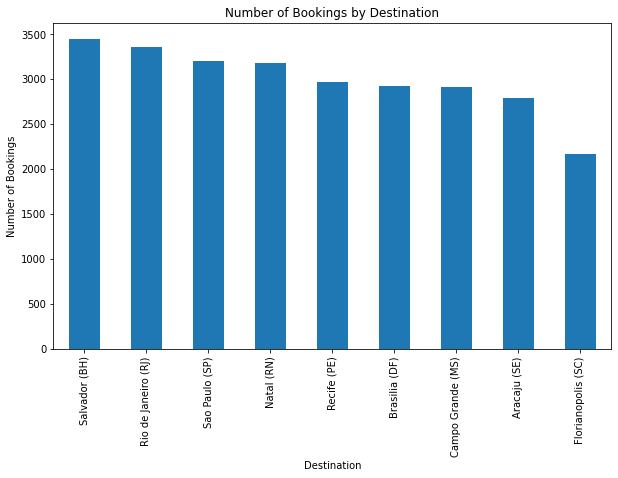

In [0]:

# Travel Patterns Analysis
plt.figure(figsize=(10, 6))
df['destination'].value_counts().plot(kind='bar')
plt.xlabel('Destination')
plt.ylabel('Number of Bookings')
plt.title('Number of Bookings by Destination')
plt.show()


From above chart, we can see that Salvador, Rio De Janeior and San Paulo are most visited cities among other cities and least visited city is Florianoplis

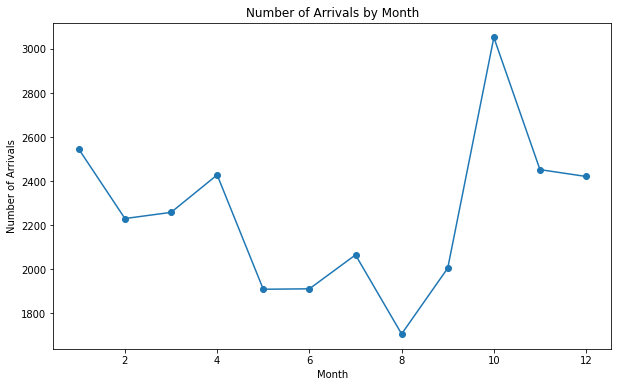

In [0]:
plt.figure(figsize=(10, 6))
df['arrival_date'] = pd.to_datetime(df['arrival_date'])
df['arrival_date'].dt.month.value_counts().sort_index().plot(kind='line', marker='o')
plt.xlabel('Month')
plt.ylabel('Number of Arrivals')
plt.title('Number of Arrivals by Month')
plt.show()

Based on graph above, we can also see that from September to October, there is a huge spike on number of travels due to fact that weather conditions are usually optimal during that period in Brazil. however,  From May to August, we can see drop in number of travels as it might be related to really high tempratures

Customer Demographics:

I will explore the age and gender distribution of customers using histograms. This provides insights into the customer demographics. I will also analyze the flight category preferences (economy, business, first class) by gender.

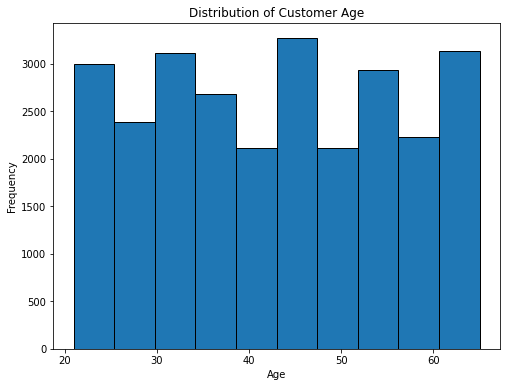

In [0]:
# Customer Demographics
plt.figure(figsize=(8, 6))
df['age'].plot(kind='hist', bins=10, edgecolor='black')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Distribution of Customer Age')
plt.show()


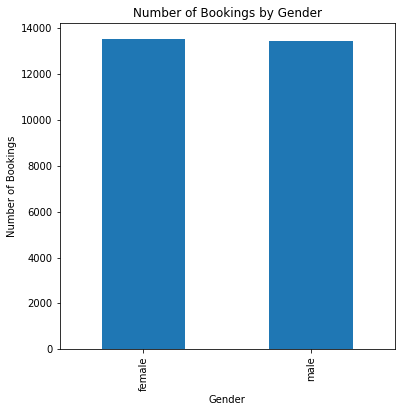

In [0]:

plt.figure(figsize=(6, 6))
df['gender'].value_counts().plot(kind='bar')
plt.xlabel('Gender')
plt.ylabel('Number of Bookings')
plt.title('Number of Bookings by Gender')
plt.show()

<Figure size 576x432 with 0 Axes>

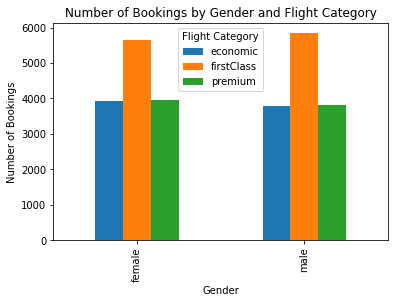

In [0]:
plt.figure(figsize=(8, 6))
df.groupby(['gender', 'flight_category']).size().unstack().plot(kind='bar')
plt.xlabel('Gender')
plt.ylabel('Number of Bookings')
plt.title('Number of Bookings by Gender and Flight Category')
plt.legend(title='Flight Category')
plt.show()


from above charts, most visited customers are between 40-45, 30-35 and 60-65 years old. The male and female distribution is almost same among customers and they usually prefer to fligh first class. The number of economic and premium fligts are almost same among femal and male customers

Pricing Analysis:I will visualize the distribution of outbound and inbound flight prices using box plots.This will provide an overview of the pricing range and potential outliers.
I will aslo analyze the relationship between flight prices and distance traveled using a scatter plot. Use the distance (km) as the x-axis and outbound/inbound prices as the y-axis.

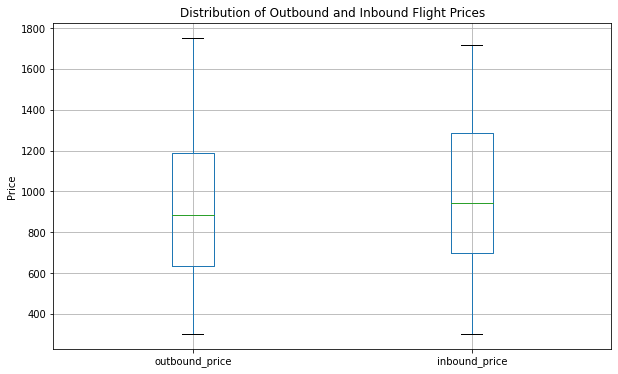

In [0]:
plt.figure(figsize=(10, 6))
df[['outbound_price', 'inbound_price']].boxplot()
plt.ylabel('Price')
plt.title('Distribution of Outbound and Inbound Flight Prices')
plt.show()


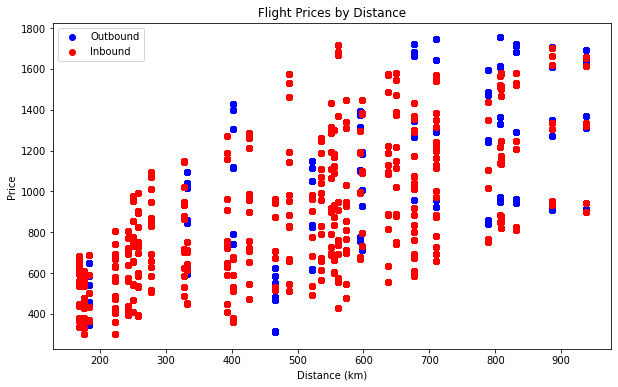

In [0]:
plt.figure(figsize=(10, 6))
plt.scatter(df['distance (km)'], df['outbound_price'], label='Outbound', color='blue')
plt.scatter(df['distance (km)'], df['inbound_price'], label='Inbound', color='red')
plt.xlabel('Distance (km)')
plt.ylabel('Price')
plt.title('Flight Prices by Distance')
plt.legend()
plt.show()

Boxplot shows that average price is 850 for outbound and 900 for inbound flights. Price range is slighly higher in inbound flights compared to outbound flights. Box plot also shows that there are no outliers. there is also postive correlation between distance travelled and the price of inbound and outbound prices

Hotel Bookings: The next cell will analyze the total hotel booking prices and their distribution using a histogram.it will aslo explore the top hotels based on the number of bookings using a bar chart.

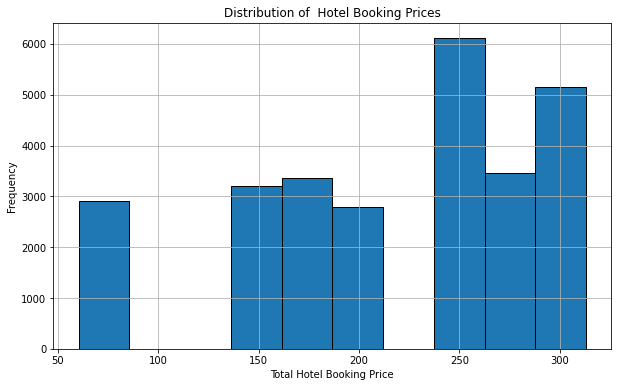

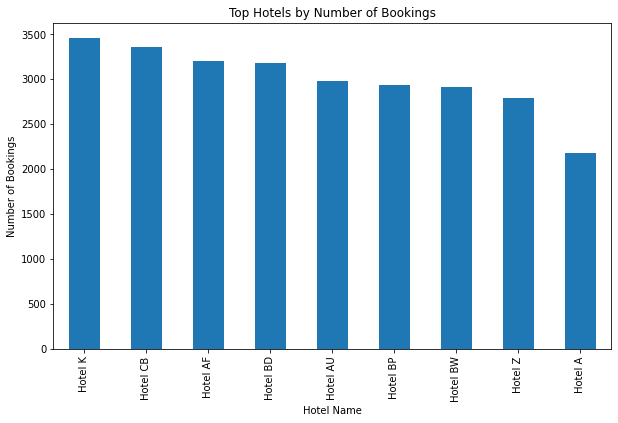

In [0]:
plt.figure(figsize=(10, 6))
df['daily_hotel_booking_price'].hist(edgecolor='black')
plt.xlabel('Total Hotel Booking Price')
plt.ylabel('Frequency')
plt.title('Distribution of  Hotel Booking Prices')
plt.show()

plt.figure(figsize=(10, 6))
df['hotel_name'].value_counts().plot(kind='bar')
plt.xlabel('Hotel Name')
plt.ylabel('Number of Bookings')
plt.title('Top Hotels by Number of Bookings')
plt.show()

The above charts show that customer usually prefer to book hotels between 200-250 prices total prices. The most visited hotel is Hotel K. and Hotel CB and the least visited hotel is Hotel A.

Agency and Company Performance:

The cell below evaluates the performance of different travel agencies and companies by comparing the number of bookings or average prices. I will user bar charts to visualize agency performance metrics.

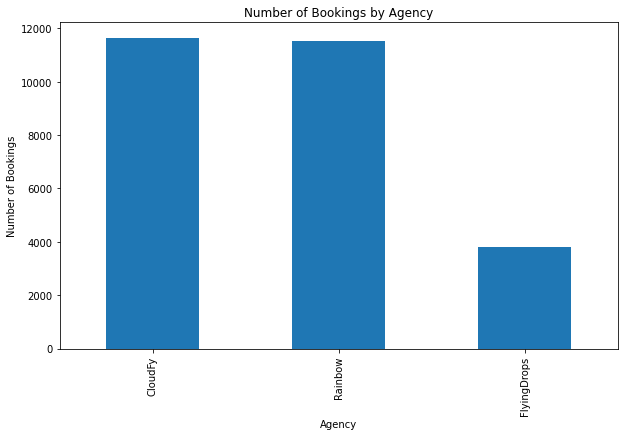

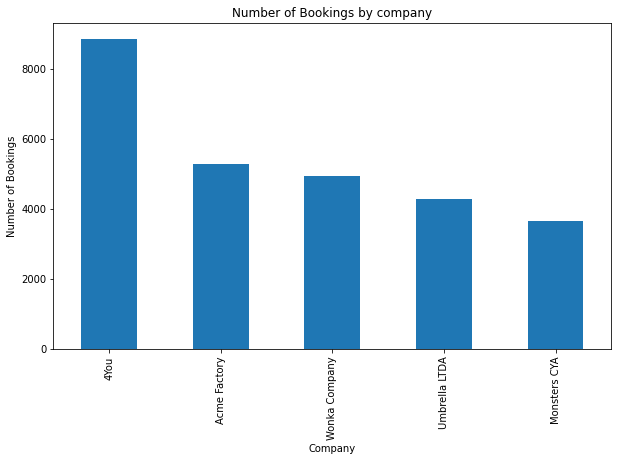

In [0]:
plt.figure(figsize=(10, 6))
df['agency'].value_counts().plot(kind='bar')
plt.xlabel('Agency')
plt.ylabel('Number of Bookings')
plt.title('Number of Bookings by Agency')
plt.show()


plt.figure(figsize=(10, 6))
df['company'].value_counts().plot(kind='bar')
plt.xlabel('Company')
plt.ylabel('Number of Bookings')
plt.title('Number of Bookings by company')
plt.show()





The Cloudfy and the Rainbow are most used travel agencies and 4You travel company is also most preferable travel company by customers.

#####Conclusion: Based analysis and finding, below would be my recommendation to achived the goal of improving customer experiences and optimizing pricing strategies.

I would recommend to leverage customer demographics (age, gender) to tailor marketing campaigns and offers that cater to specific customer segments. I would also offer personalized recommendations and travel packages based on customer preferences, such as preferred destinations, flight categories, or hotel choices.

Apart fro that, analyzing pricing patterns and customer behavior would be beneficial to  optimize pricing strategies.I would consider factors such as distance traveled, flight category, and hotel booking prices to determine competitive and attractive pricing points. I would also implement dynamic pricing strategies based on demand fluctuations, seasonal trends, and booking patterns to maximize revenue.

In order to improve customer satisfaction, I would identify popular destinations and travel patterns to anticipate customer needs and provide customized travel experiences.I would aslo partner with preferred hotels and leverage customer data to offer seamless hotel booking experiences and competitive pricing.